In [96]:
#importing libraries
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np 
import pandas as pd 
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import StandardScaler

2025-10-26 08:00:30.416839: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-10-26 08:00:30.966466: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1761465631.133401    2140 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1761465631.174911    2140 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1761465631.470736    2140 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

In [97]:
dfo=pd.read_csv("/mnt/c/Users/jayen/OneDrive/Documents/GitHub/Binary-Classification-with-a-PulsarDataset/train.csv")

In [98]:
dfo[dfo['Class'] == 1]


,id,Mean_Integrated,SD,EK,Skewness,Mean_DMSNR_Curve,SD_DMSNR_Curve,EK_DMSNR_Curve,Skewness_DMSNR_Curve,Class
15,15,63.476562,31.715708,3.335721,13.586952,15.754181,46.037360,3.204774,9.544324,1
29,29,14.851562,46.501748,3.989773,15.945822,160.060201,71.532766,-0.615833,-0.148055,1
32,32,38.835938,36.460989,4.417519,20.587099,114.475752,75.539718,0.243013,-0.744468,1
33,33,31.601562,28.579095,5.236330,30.589373,96.708194,79.649752,0.514812,-0.807272,1
51,51,24.335938,30.715201,5.542155,31.523730,32.978261,60.549866,2.135435,3.773896,1
...,...,...,...,...,...,...,...,...,...,...
117527,117527,39.687500,31.007902,4.686138,25.544820,41.642140,72.195851,1.434829,0.832944,1
117542,117542,27.640625,32.614088,4.796125,27.347462,62.850334,73.429037,1.093908,0.096656,1
117545,117545,76.515625,55.627736,2.042536,4.229606,38.352843,65.283688,1.616087,1.462232,1
117555,117555,34.984375,27.461034,5.473133,32.744258,46.025084,68.801723,1.516625,0.745529,1


In [99]:

df, df_test= train_test_split(
    dfo, 
    test_size=0.2,  
    random_state=42 
)

In [100]:
# performing EDA

In [101]:
df.size

940510

In [102]:
df.shape

(94051, 10)

In [103]:
df.head()

,id,Mean_Integrated,SD,EK,Skewness,Mean_DMSNR_Curve,SD_DMSNR_Curve,EK_DMSNR_Curve,Skewness_DMSNR_Curve,Class
100151,100151,117.289062,46.829120,0.152475,0.106734,2.496656,16.515567,8.778636,97.569187,0
45660,45660,106.976562,48.029653,0.565406,0.263587,111.006689,82.489980,-0.540919,-1.688908,0
198,198,132.742188,57.882668,-0.221301,-0.742605,3.211538,22.451232,8.189991,71.616974,0
91924,91924,106.593750,44.774773,0.482009,0.452013,2.770903,16.836345,8.322915,85.172403,0
87875,87875,126.085938,60.248734,0.058579,-0.710809,2.398829,15.353178,9.424440,111.474453,0


In [104]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 94051 entries, 100151 to 15795
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    94051 non-null  int64  
 1   Mean_Integrated       94051 non-null  float64
 2   SD                    94051 non-null  float64
 3   EK                    94051 non-null  float64
 4   Skewness              94051 non-null  float64
 5   Mean_DMSNR_Curve      94051 non-null  float64
 6   SD_DMSNR_Curve        94051 non-null  float64
 7   EK_DMSNR_Curve        94051 non-null  float64
 8   Skewness_DMSNR_Curve  94051 non-null  float64
 9   Class                 94051 non-null  int64  
dtypes: float64(8), int64(2)
memory usage: 7.9 MB


In [105]:
df.isnull().sum()

id                      0
Mean_Integrated         0
SD                      0
EK                      0
Skewness                0
Mean_DMSNR_Curve        0
SD_DMSNR_Curve          0
EK_DMSNR_Curve          0
Skewness_DMSNR_Curve    0
Class                   0
dtype: int64

In [106]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,94051.0,58890.616634,33955.999420,1.000000,29445.500000,58960.000000,88333.500000,117563.000000
Mean_Integrated,94051.0,111.254289,24.892135,6.054688,104.546875,116.664062,126.281250,189.367188
SD,94051.0,46.719537,6.111243,24.783273,43.450894,47.493441,50.870081,93.602933
EK,94051.0,0.502994,1.125421,-1.730782,0.049779,0.186862,0.396040,7.860003
Skewness,94051.0,1.881862,6.495839,-1.791886,-0.189705,0.091665,0.691613,65.385974
Mean_DMSNR_Curve,94051.0,11.984783,26.797930,0.213211,2.086120,2.805184,4.122910,217.371238
SD_DMSNR_Curve,94051.0,26.196120,20.070697,7.370432,14.945319,18.163669,24.729867,109.890785
EK_DMSNR_Curve,94051.0,8.041818,3.847059,-2.597872,6.743183,8.440796,10.013837,34.539844
Skewness_DMSNR_Curve,94051.0,94.040031,80.155354,-1.976976,49.490474,83.410571,122.601811,1191.000837
Class,94051.0,0.093269,0.290810,0.000000,0.000000,0.000000,0.000000,1.000000


In [107]:
df.drop('id',axis=1,inplace=True)

In [108]:
for i in df.columns:
    print(i,'---',df[i].skew())

Mean_Integrated --- -1.8413252252827021
SD --- -0.5220480755651818
EK --- 3.432764686310617
Skewness --- 4.381076190748772
Mean_DMSNR_Curve --- 3.4283525584496166
SD_DMSNR_Curve --- 2.010583972953181
EK_DMSNR_Curve --- -0.0423456830416359
Skewness_DMSNR_Curve --- 2.3724928123962448
Class --- 2.797291580835516


In [109]:
#Data visualization

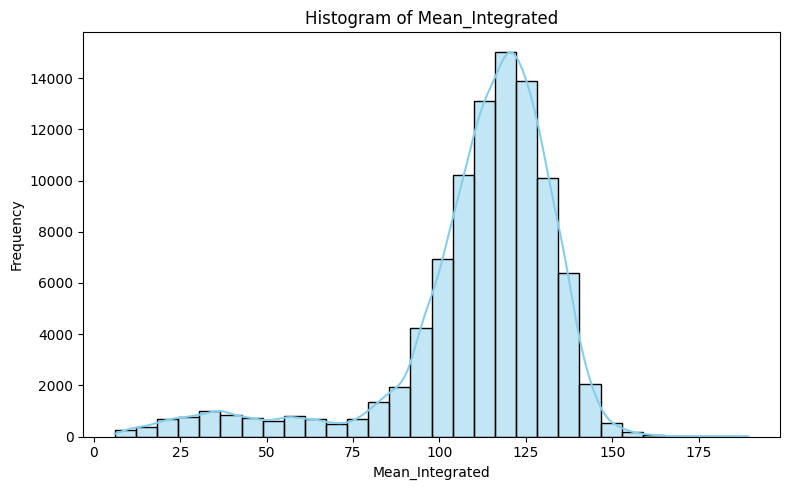

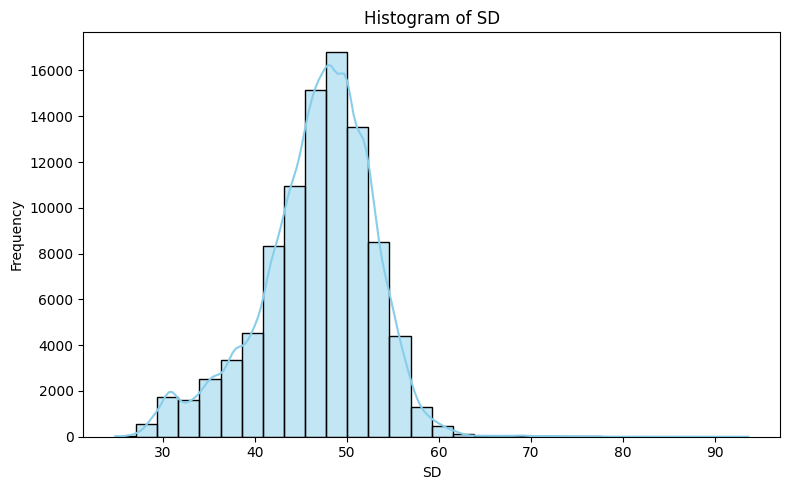

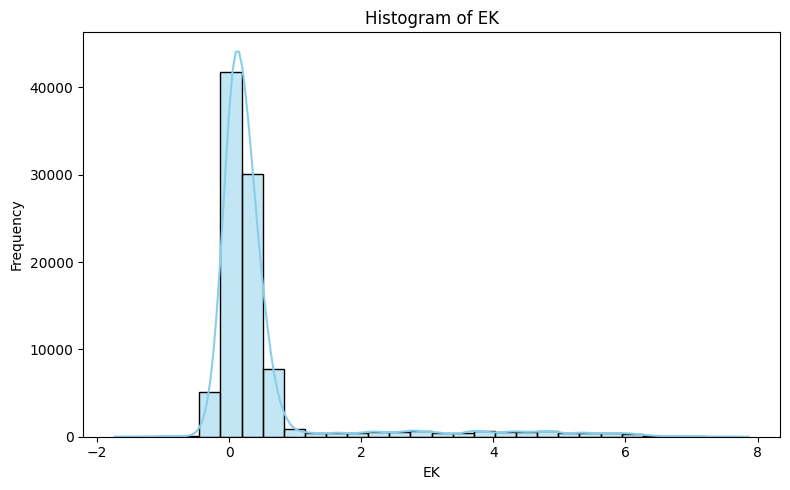

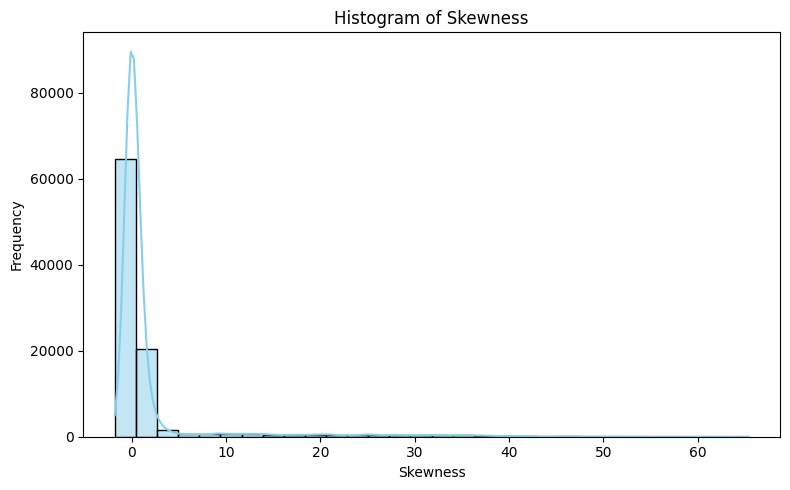

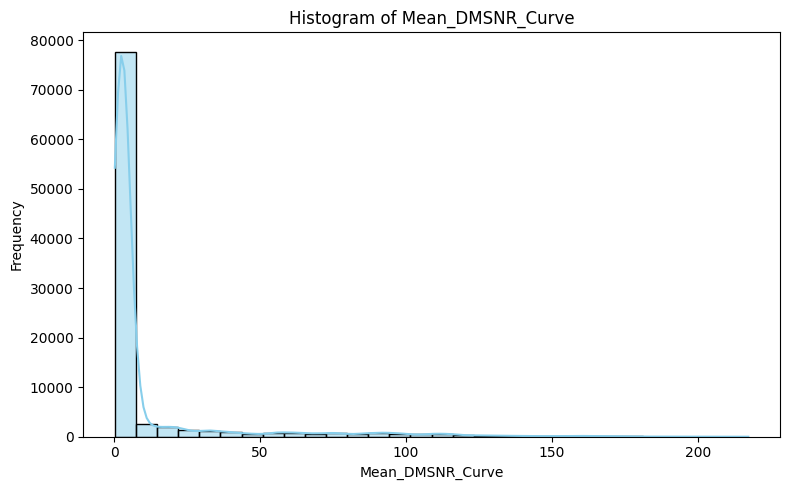

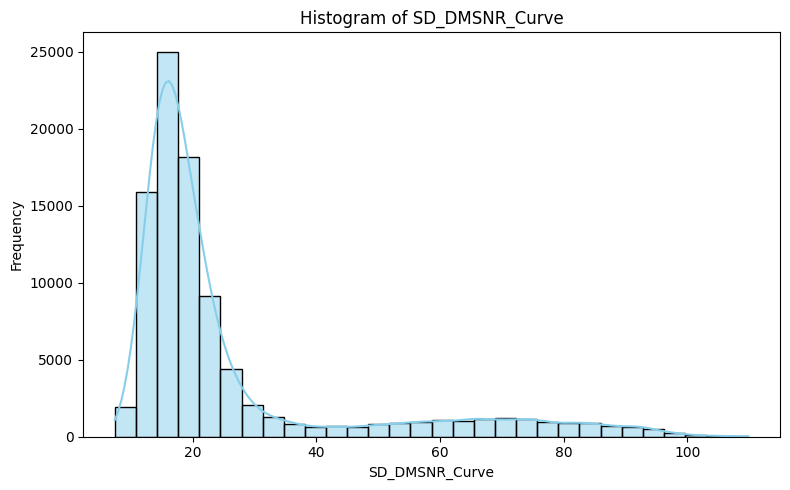

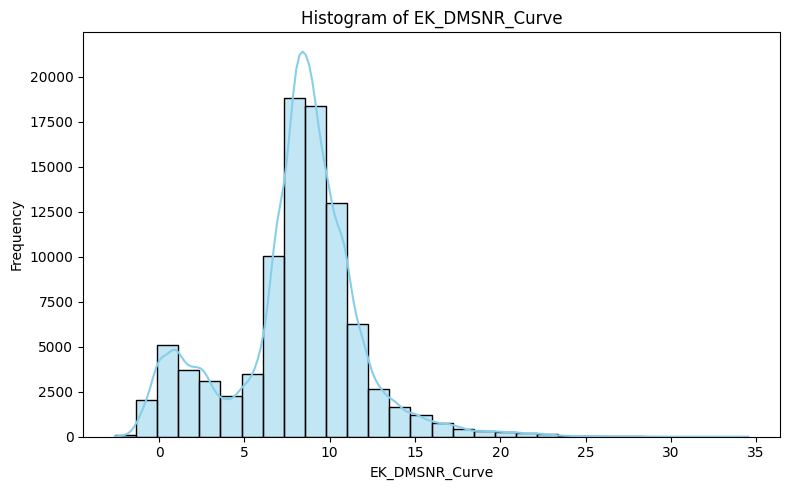

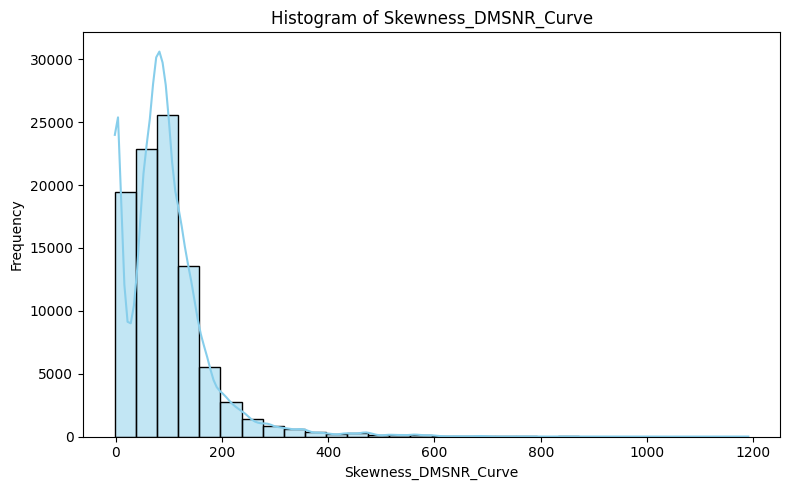

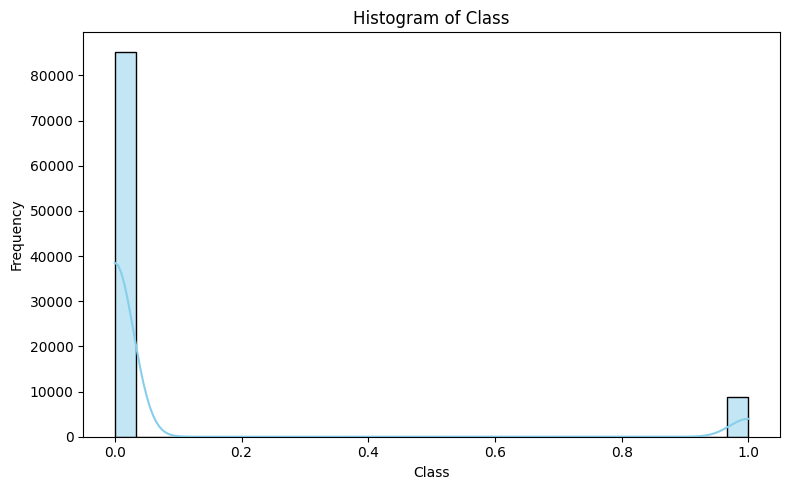

In [110]:
for col in df.columns:
        plt.figure(figsize=(8, 5))
        sns.histplot(df[col], kde=True, bins=30, color="skyblue")
        plt.title(f'Histogram of {col}', fontsize=12)
        plt.xlabel(col)
        plt.ylabel('Frequency')
        plt.tight_layout()
        plt.show()


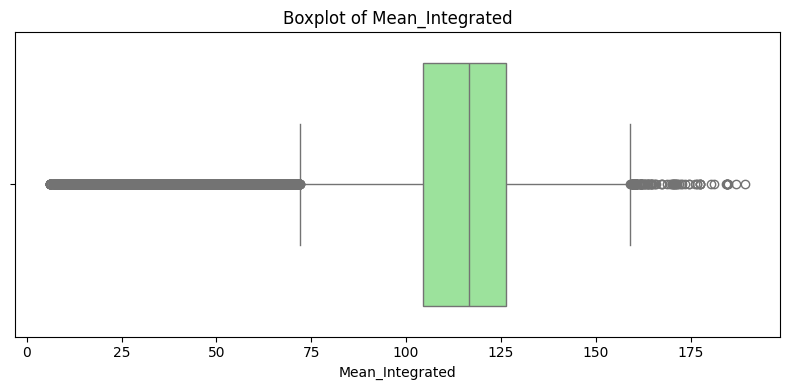

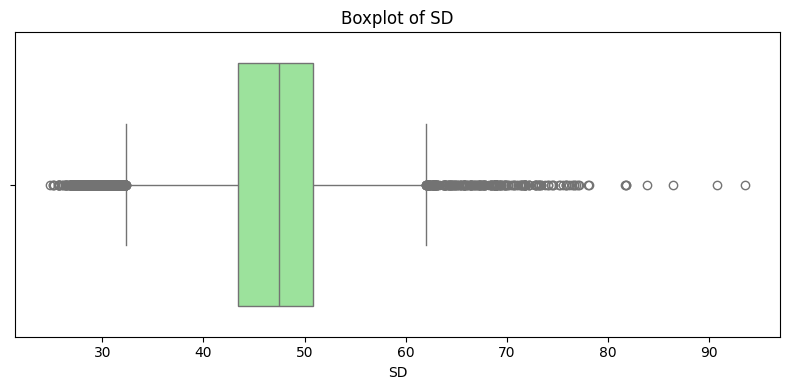

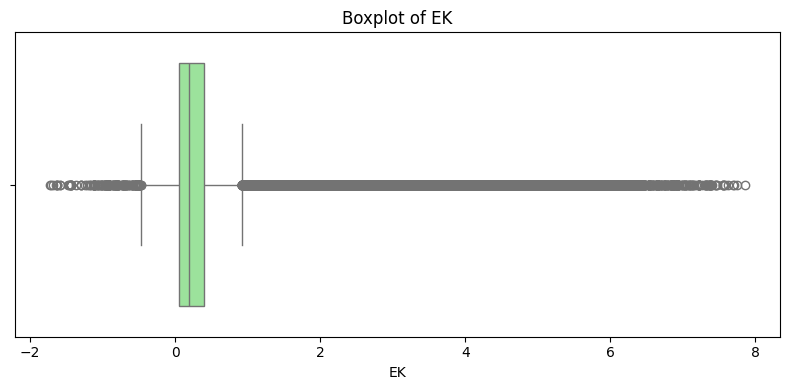

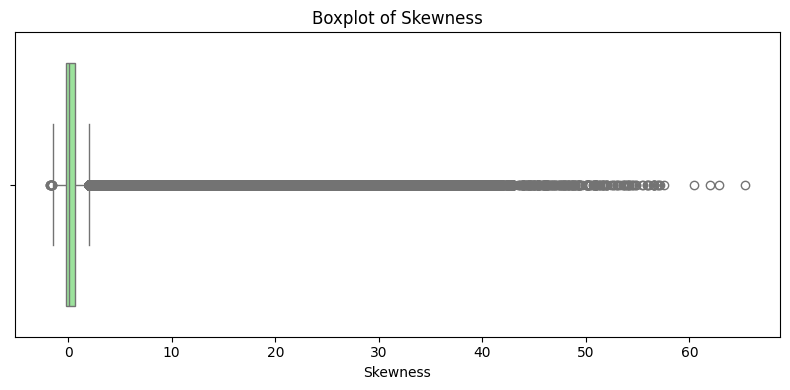

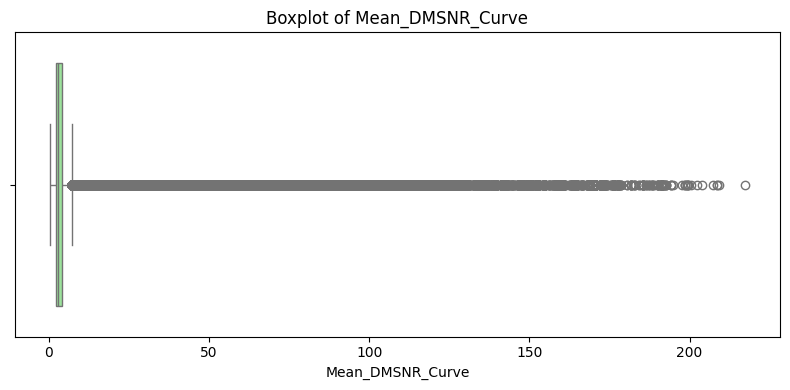

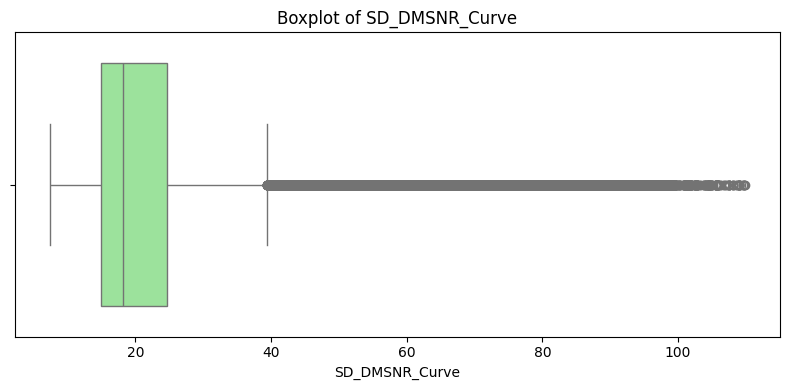

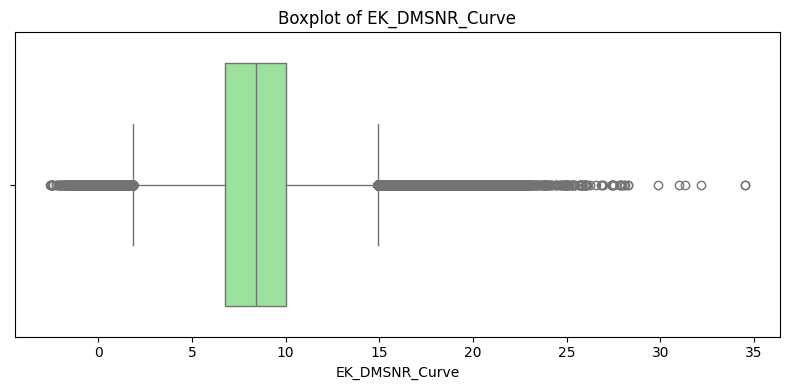

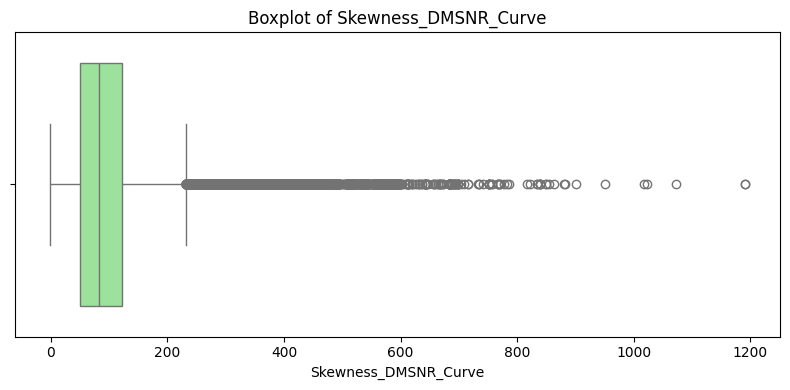

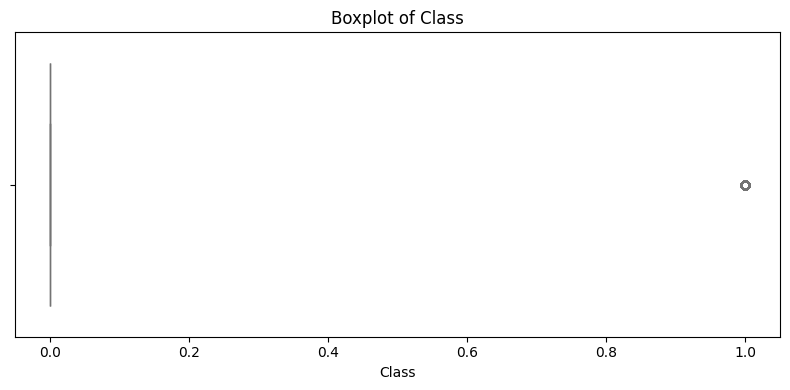

In [111]:


for col in df.columns:
        plt.figure(figsize=(8, 4))
        sns.boxplot(x=df[col], color="lightgreen")
        plt.title(f'Boxplot of {col}', fontsize=12)
        plt.xlabel(col)
        plt.tight_layout()
        plt.show()
    

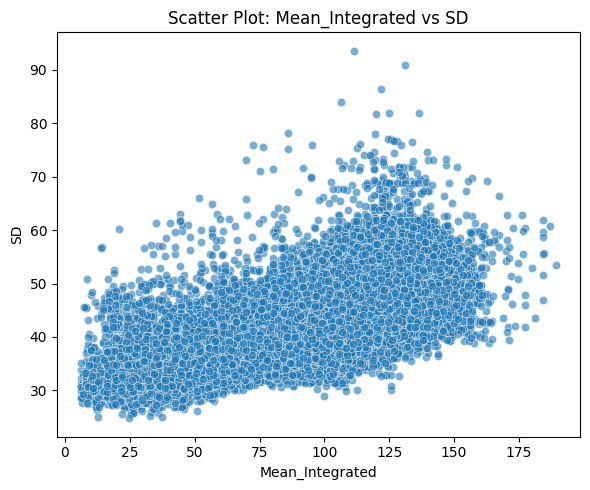

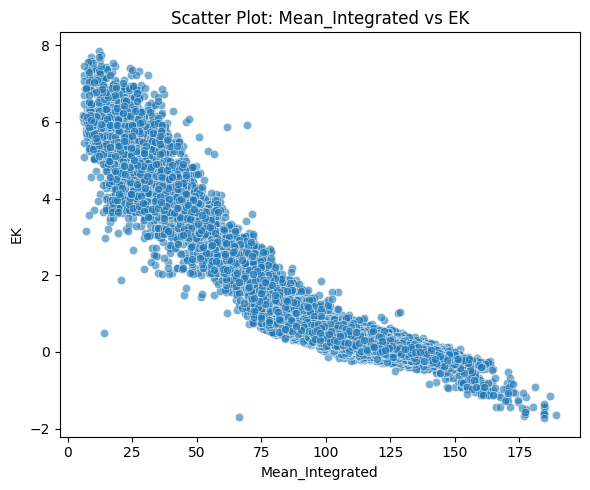

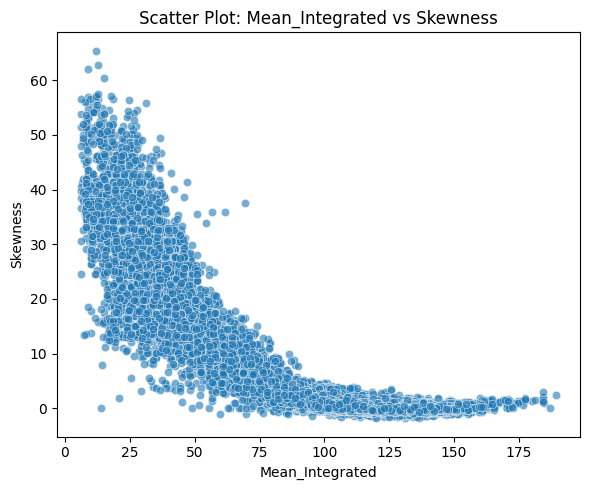

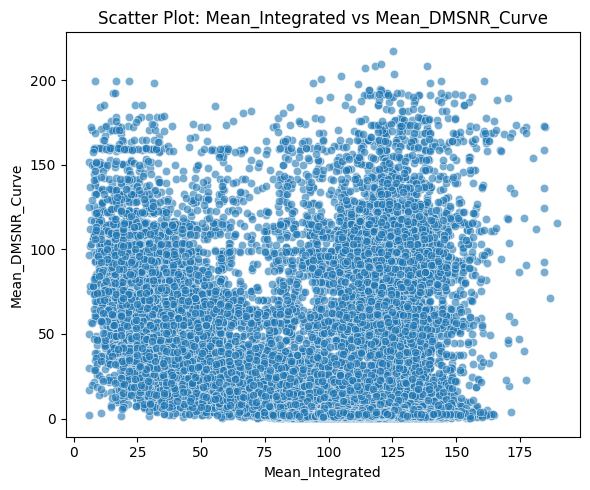

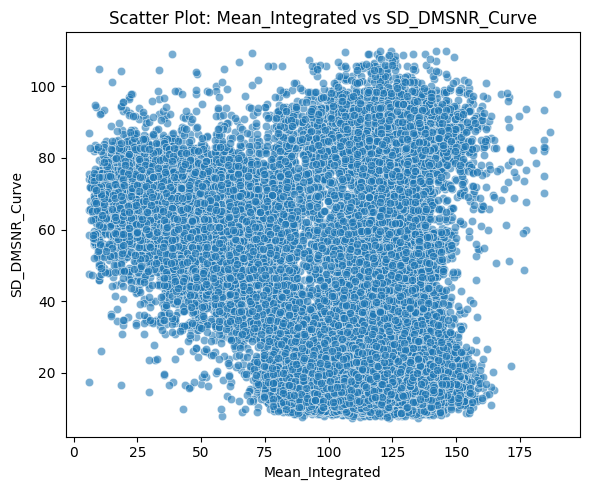

...

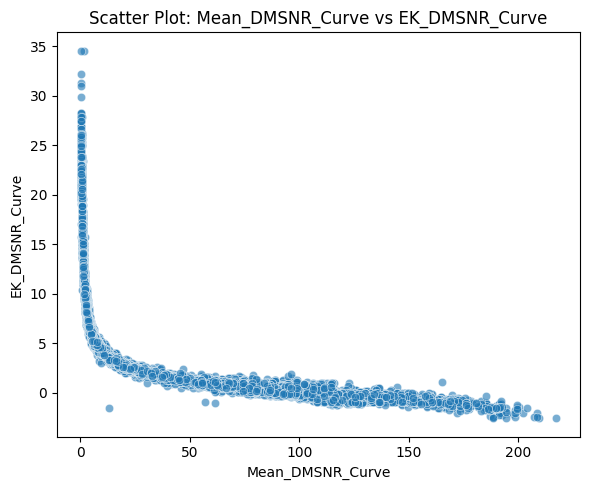

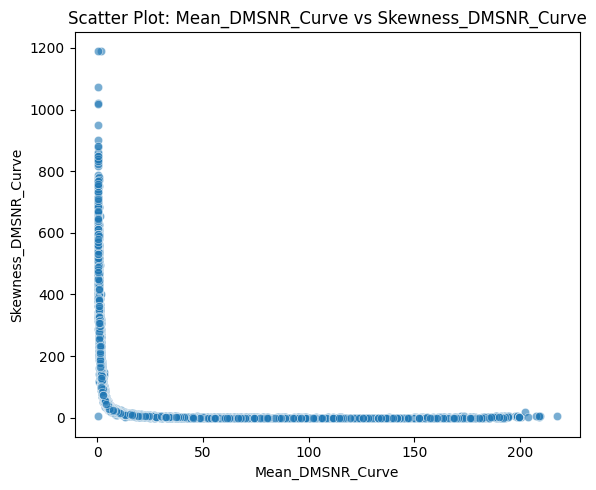

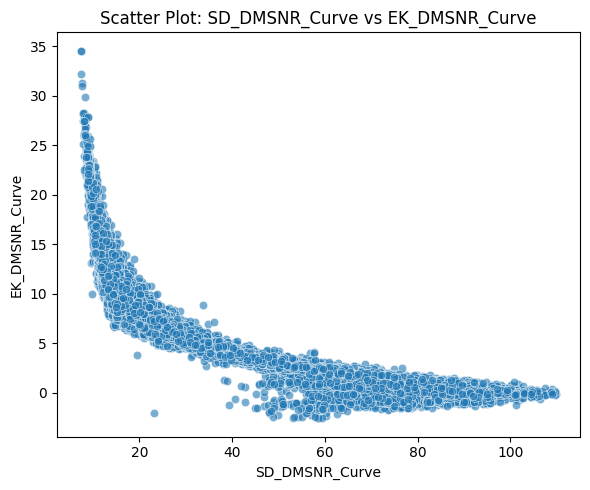

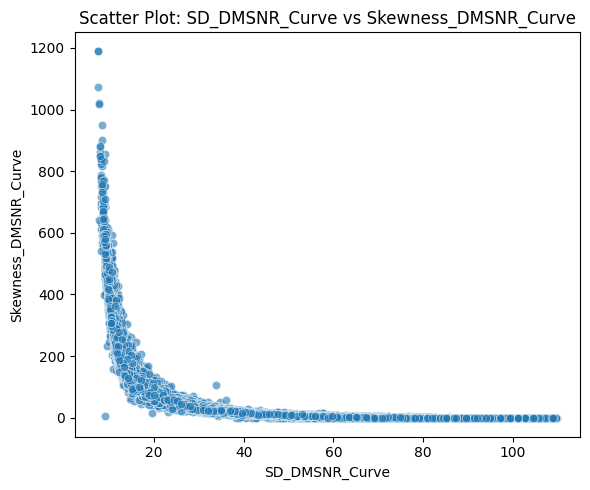

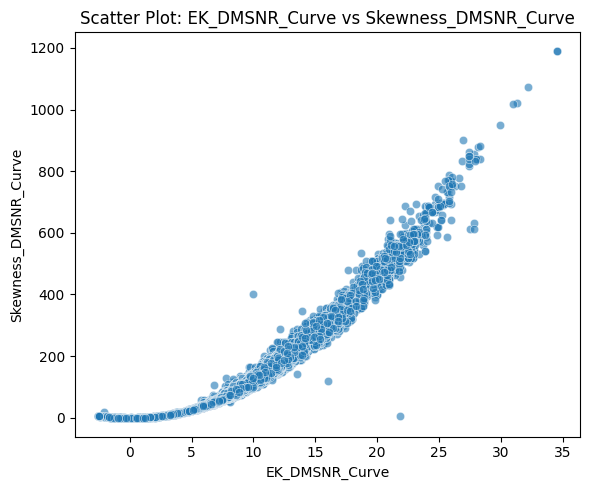

In [112]:


import itertools


num_cols = df.select_dtypes(include=['float64']).columns


for col1, col2 in itertools.combinations(num_cols, 2):
    plt.figure(figsize=(6, 5))
    sns.scatterplot(data=df, x=col1, y=col2, alpha=0.6)
    plt.title(f'Scatter Plot: {col1} vs {col2}', fontsize=12)
    plt.xlabel(col1)
    plt.ylabel(col2)
    plt.tight_layout()
    plt.show()


In [113]:
df_iqr=df.copy()


In [114]:
df_iqr.info()

<class 'pandas.core.frame.DataFrame'>
Index: 94051 entries, 100151 to 15795
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Mean_Integrated       94051 non-null  float64
 1   SD                    94051 non-null  float64
 2   EK                    94051 non-null  float64
 3   Skewness              94051 non-null  float64
 4   Mean_DMSNR_Curve      94051 non-null  float64
 5   SD_DMSNR_Curve        94051 non-null  float64
 6   EK_DMSNR_Curve        94051 non-null  float64
 7   Skewness_DMSNR_Curve  94051 non-null  float64
 8   Class                 94051 non-null  int64  
dtypes: float64(8), int64(1)
memory usage: 7.2 MB


In [115]:
# Outlier Management 

In [116]:
import numpy as np

def iqr_trim_and_count(df, col, factor=1.5):
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    
    lb = Q1 - factor * IQR
    ub = Q3 + factor * IQR
    
    # Count outliers
    below_count = (df[col] < lb).sum()
    above_count = (df[col] > ub).sum()
    
    print(f"Column: {col}")
    print(f"  Q1 = {Q1:.2f}, Q3 = {Q3:.2f}, IQR = {IQR:.2f}")
    print(f"  Lower Bound = {lb:.2f}, Upper Bound = {ub:.2f}")
    print(f"  Values below LB: {below_count}, Values above UB: {above_count}")
    
    # Trim the outliers
    df_trimmed = df[(df[col] >= lb) & (df[col] <= ub)].copy()
    
    return df_trimmed, below_count, above_count

# Apply to all numeric columns
numeric_cols = df_iqr.select_dtypes(include=['float64']).columns
df_trimmed = df_iqr.copy()

for col in numeric_cols:
    df_trimmed, below, above = iqr_trim_and_count(df_trimmed, col)


Column: Mean_Integrated
  Q1 = 104.55, Q3 = 126.28, IQR = 21.73
  Lower Bound = 71.95, Upper Bound = 158.88
  Values below LB: 7202, Values above UB: 105
Column: SD
  Q1 = 44.45, Q3 = 51.11, IQR = 6.66
  Lower Bound = 34.47, Upper Bound = 61.10
  Values below LB: 468, Values above UB: 334
Column: EK
  Q1 = 0.04, Q3 = 0.34, IQR = 0.30
  Lower Bound = -0.41, Upper Bound = 0.79
  Values below LB: 131, Values above UB: 2016
Column: Skewness
  Q1 = -0.23, Q3 = 0.39, IQR = 0.63
  Lower Bound = -1.18, Upper Bound = 1.34
  Values below LB: 3, Values above UB: 4287
Column: Mean_DMSNR_Curve
  Q1 = 2.04, Q3 = 3.58, IQR = 1.54
  Lower Bound = -0.27, Upper Bound = 5.90
  Values below LB: 0, Values above UB: 8875
Column: SD_DMSNR_Curve
  Q1 = 14.49, Q3 = 20.09, IQR = 5.60
  Lower Bound = 6.09, Upper Bound = 28.49
  Values below LB: 0, Values above UB: 963
Column: EK_DMSNR_Curve
  Q1 = 7.93, Q3 = 10.57, IQR = 2.63
  Lower Bound = 3.99, Upper Bound = 14.51
  Values below LB: 0, Values above UB: 3311
C

In [117]:
import numpy as np

def iqr_cap_and_count(df, col, factor=1.5):

    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    
    lb = Q1 - factor * IQR
    ub = Q3 + factor * IQR
    
    # Count outliers
    below_count = (df[col] < lb).sum()
    above_count = (df[col] > ub).sum()
    
    print(f"Column: {col}")
    print(f"  Q1 = {Q1:.2f}, Q3 = {Q3:.2f}, IQR = {IQR:.2f}")
    print(f"  Lower Bound = {lb:.2f}, Upper Bound = {ub:.2f}")
    print(f"  Values below LB: {below_count}, Values above UB: {above_count}")
    
    # Cap the outliers
    df[col] = np.where(df[col] < lb, lb, df[col])
    df[col] = np.where(df[col] > ub, ub, df[col])
    
    return df[col], below_count, above_count


In [118]:
numeric_cols = df_iqr.select_dtypes(include=['float64']).columns
for col in numeric_cols:
    df_iqr[col], below, above = iqr_cap_and_count(df_iqr, col)

Column: Mean_Integrated
  Q1 = 104.55, Q3 = 126.28, IQR = 21.73
  Lower Bound = 71.95, Upper Bound = 158.88
  Values below LB: 7202, Values above UB: 105
Column: SD
  Q1 = 43.45, Q3 = 50.87, IQR = 7.42
  Lower Bound = 32.32, Upper Bound = 62.00
  Values below LB: 2770, Values above UB: 233
Column: EK
  Q1 = 0.05, Q3 = 0.40, IQR = 0.35
  Lower Bound = -0.47, Upper Bound = 0.92
  Values below LB: 169, Values above UB: 8663
Column: Skewness
  Q1 = -0.19, Q3 = 0.69, IQR = 0.88
  Lower Bound = -1.51, Upper Bound = 2.01
  Values below LB: 10, Values above UB: 10550
Column: Mean_DMSNR_Curve
  Q1 = 2.09, Q3 = 4.12, IQR = 2.04
  Lower Bound = -0.97, Upper Bound = 7.18
  Values below LB: 0, Values above UB: 16605
Column: SD_DMSNR_Curve
  Q1 = 14.95, Q3 = 24.73, IQR = 9.78
  Lower Bound = 0.27, Upper Bound = 39.41
  Values below LB: 0, Values above UB: 14958
Column: EK_DMSNR_Curve
  Q1 = 6.74, Q3 = 10.01, IQR = 3.27
  Lower Bound = 1.84, Upper Bound = 14.92
  Values below LB: 9494, Values above U

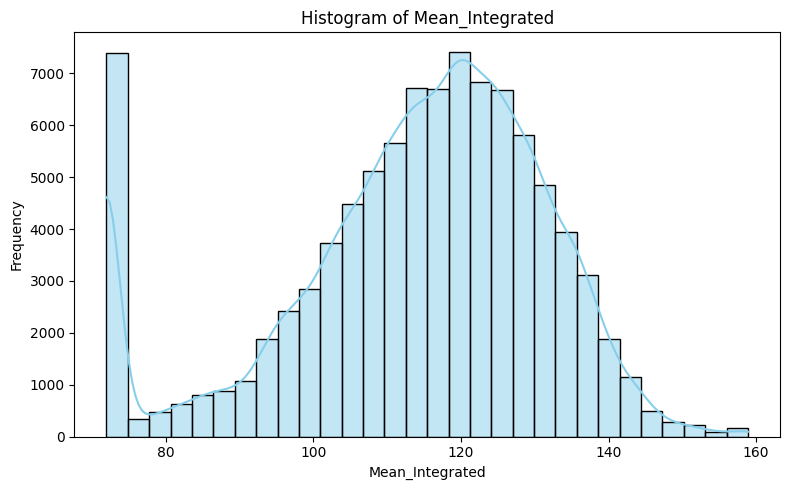

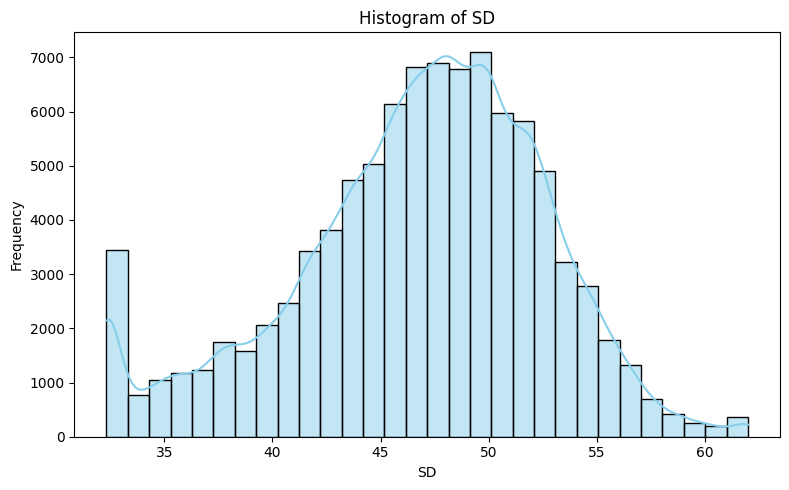

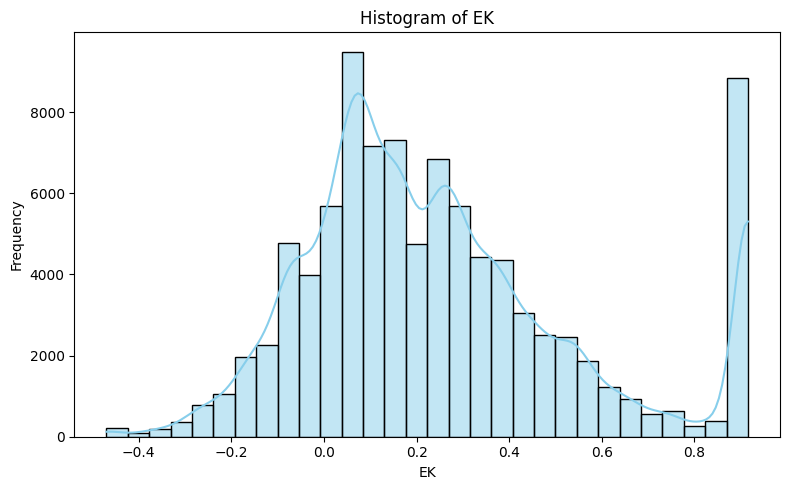

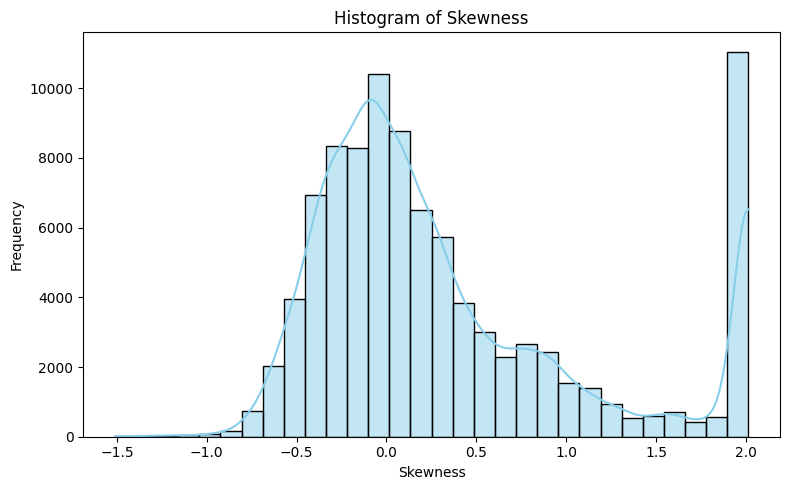

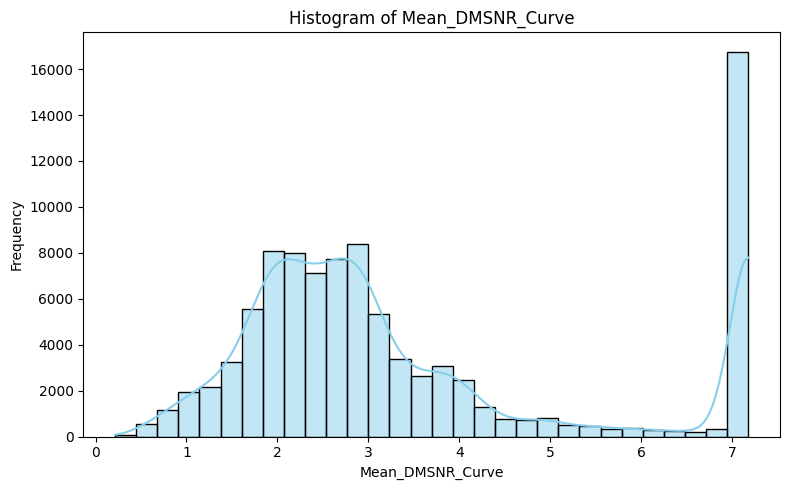

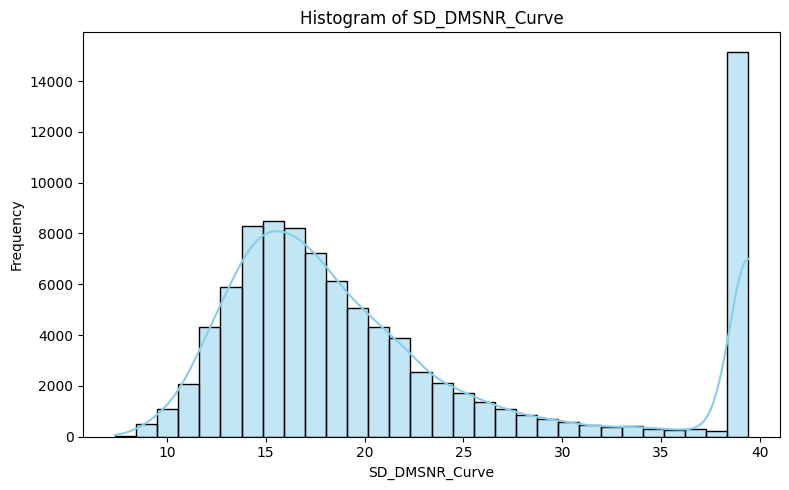

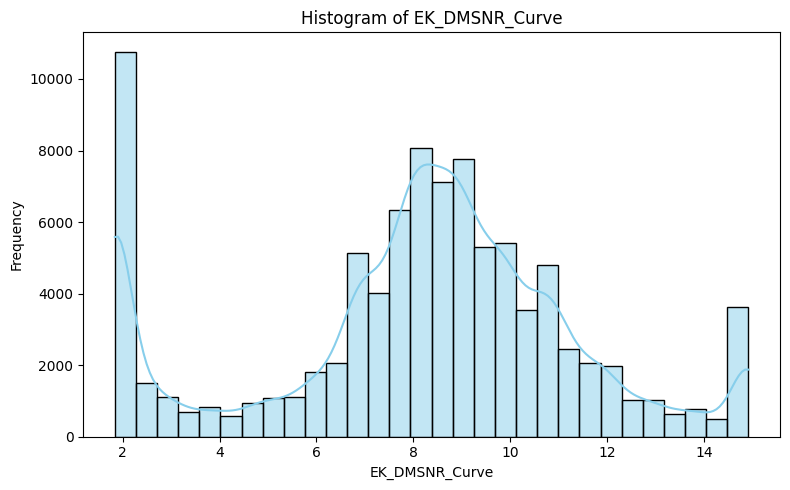

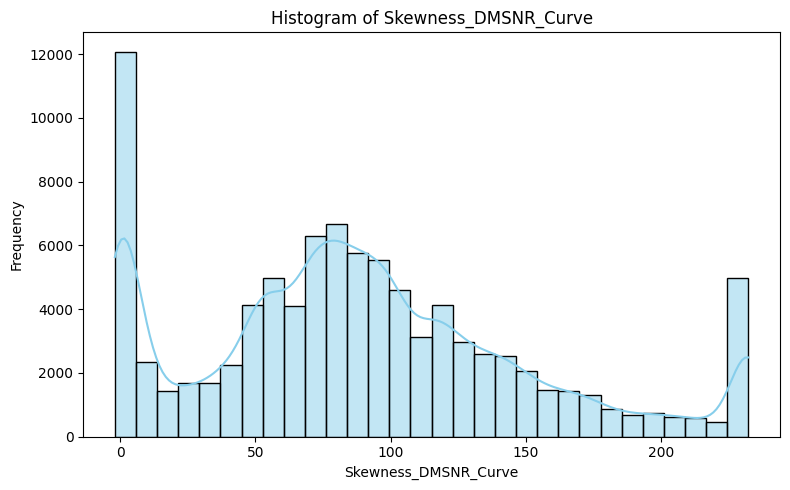

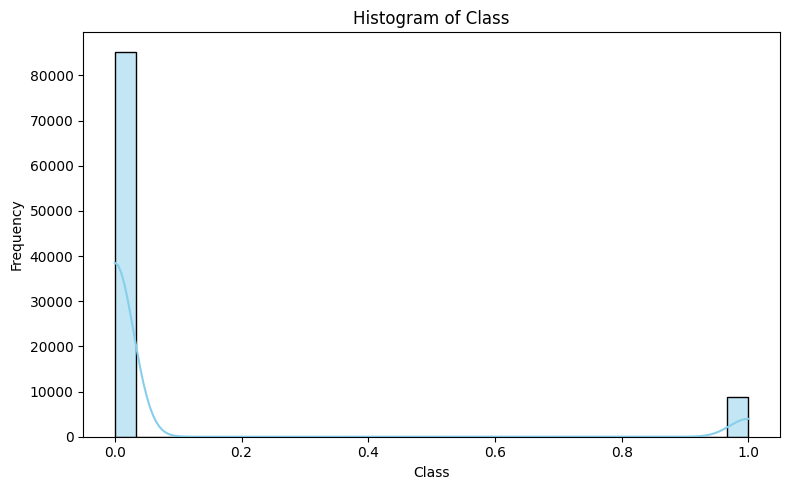

In [119]:
for col in df_iqr.columns:
        plt.figure(figsize=(8, 5))
        sns.histplot(df_iqr[col], kde=True, bins=30, color="skyblue")
        plt.title(f'Histogram of {col}', fontsize=12)
        plt.xlabel(col)
        plt.ylabel('Frequency')
        plt.tight_layout()
        plt.show()

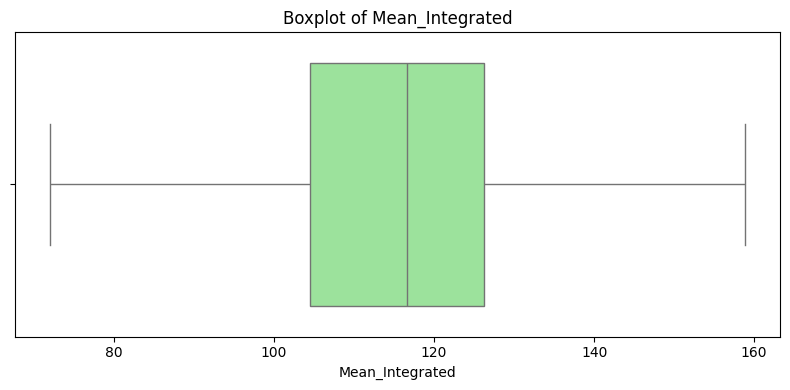

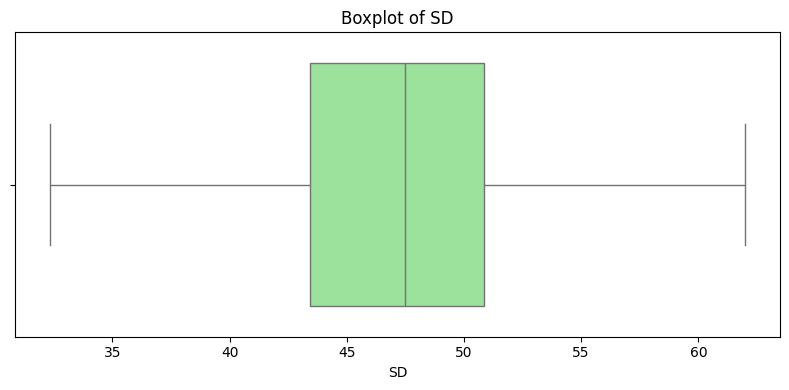

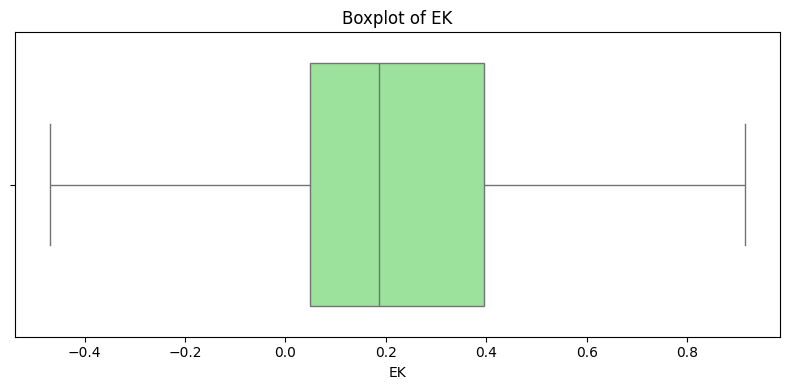

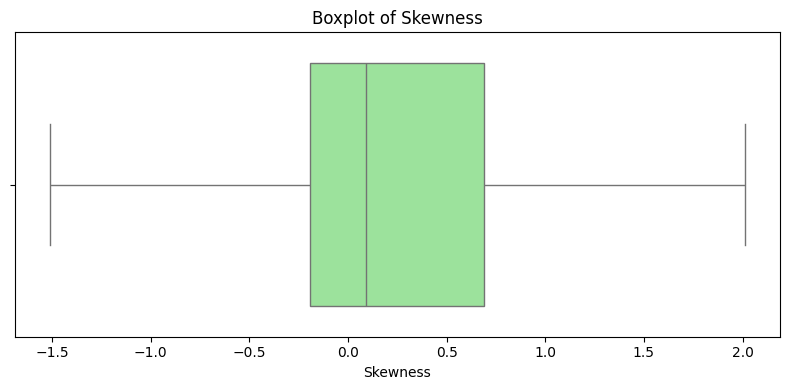

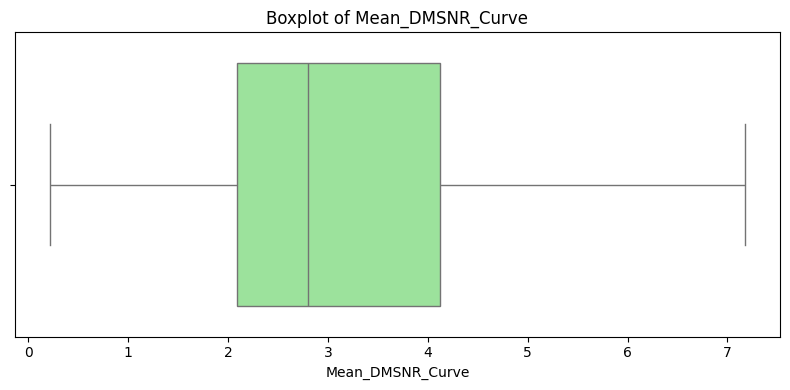

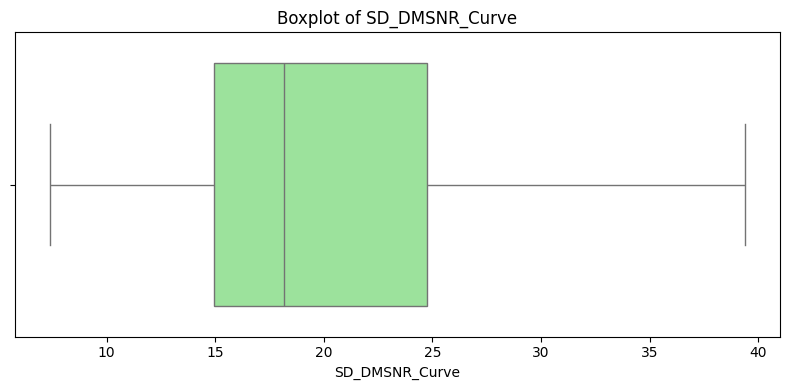

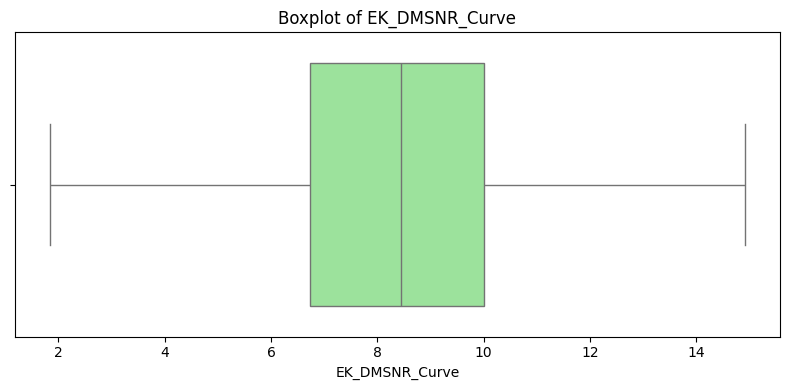

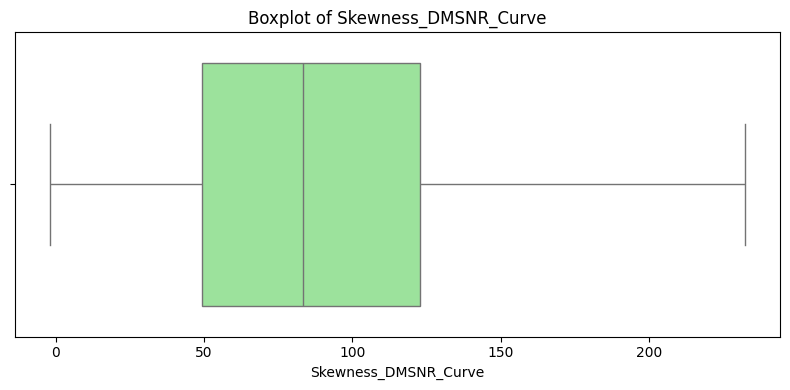

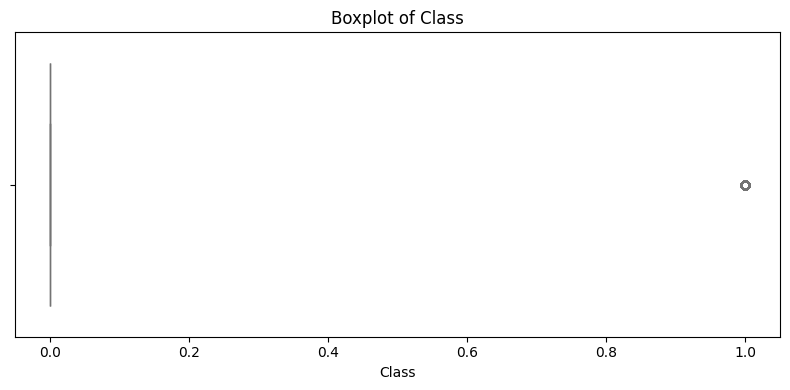

In [120]:
for col in df_iqr.columns:
        plt.figure(figsize=(8, 4))
        sns.boxplot(x=df_iqr[col], color="lightgreen")
        plt.title(f'Boxplot of {col}', fontsize=12)
        plt.xlabel(col)
        plt.tight_layout()
        plt.show()
    



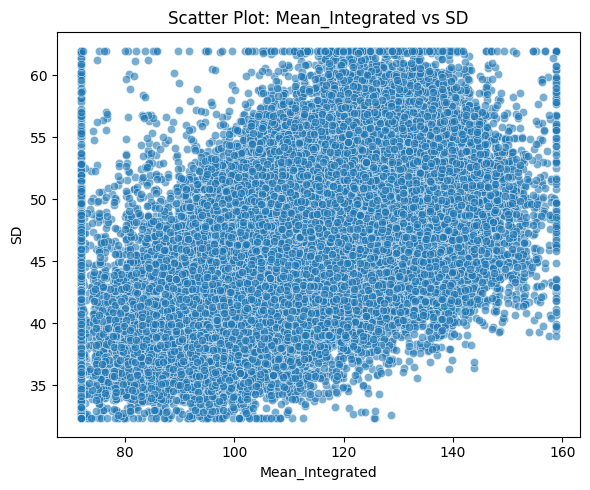

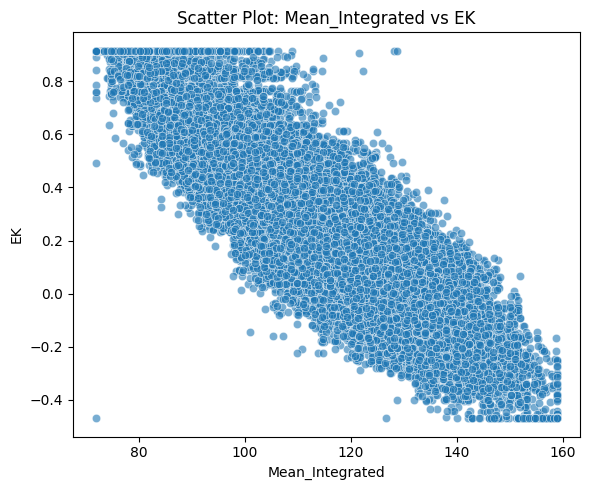

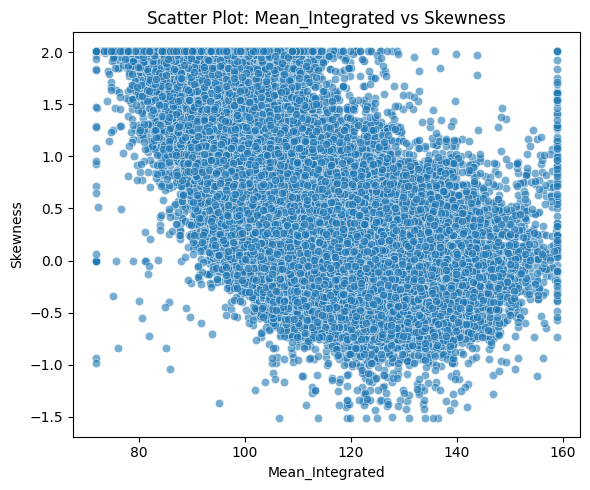

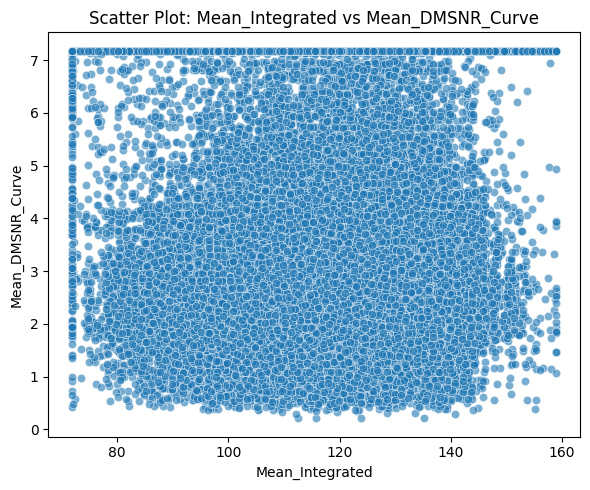

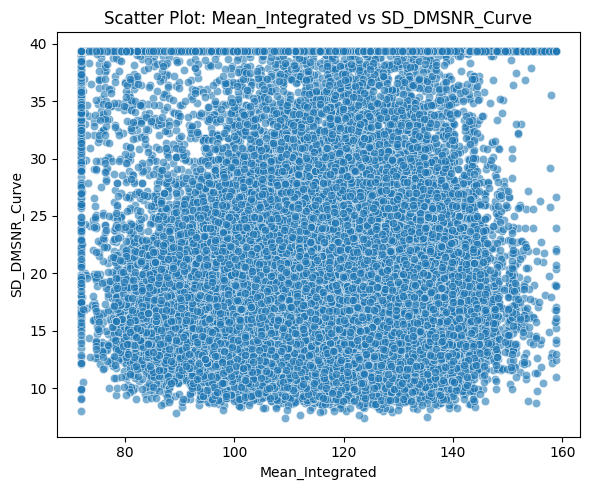

...

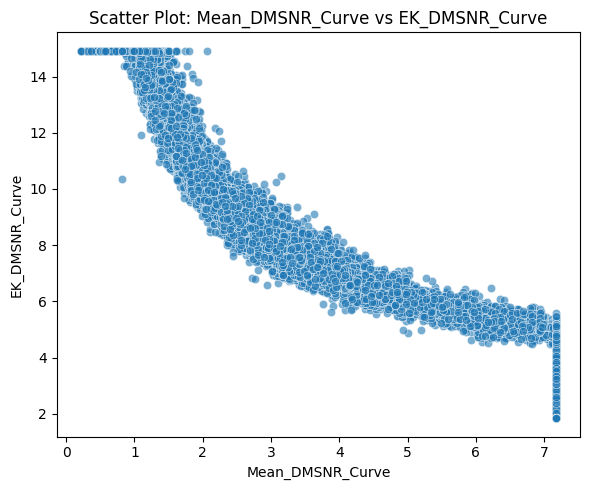

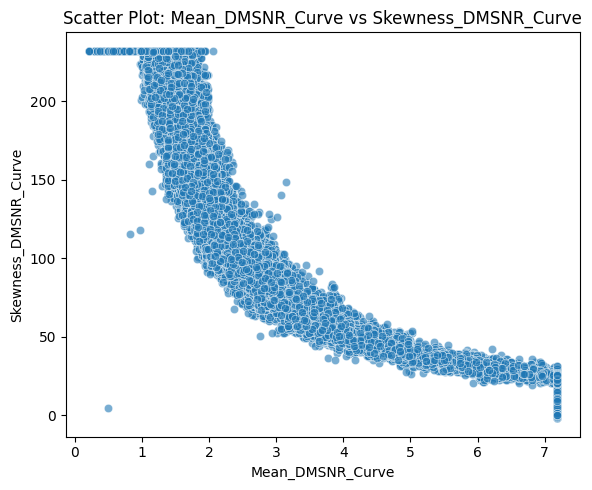

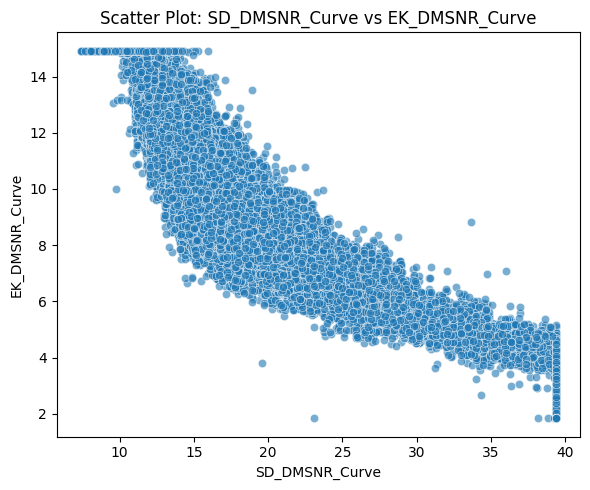

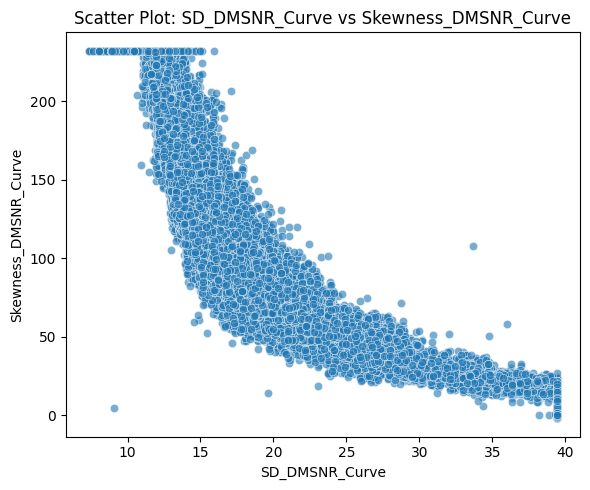

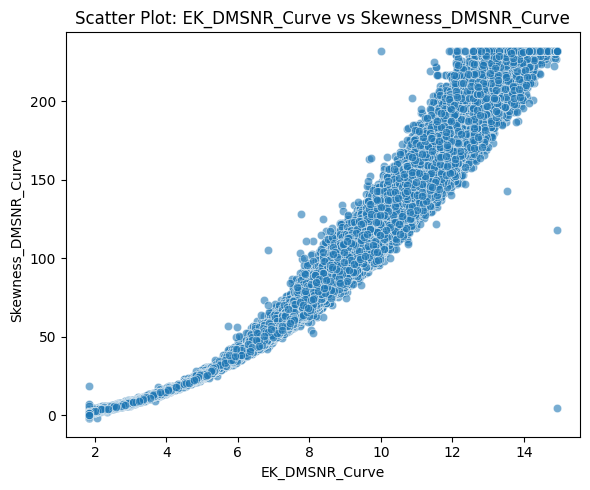

In [121]:
import itertools


num_cols = df_iqr.select_dtypes(include=['float64']).columns


for col1, col2 in itertools.combinations(num_cols, 2):
    plt.figure(figsize=(6, 5))
    sns.scatterplot(data=df_iqr, x=col1, y=col2, alpha=0.6)
    plt.title(f'Scatter Plot: {col1} vs {col2}', fontsize=12)
    plt.xlabel(col1)
    plt.ylabel(col2)
    plt.tight_layout()
    plt.show()


In [122]:
df['Class'].value_counts()

Class
0    85279
1     8772
Name: count, dtype: int64

In [123]:
df_iqr['Class'].value_counts()

Class
0    85279
1     8772
Name: count, dtype: int64

In [124]:
df_iqr.shape

(94051, 9)

In [126]:

X = df_iqr.drop(columns=['Class'])  
y = df_iqr['Class']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)


In [127]:
# imbalance management
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)


In [128]:
X_train_smote, y_train_smote, X_test, y_test

(        Mean_Integrated         SD        EK  Skewness  Mean_DMSNR_Curve  \
 0            110.039062  47.002366  0.259371  0.191636          1.670569   
 1            135.367188  47.399698 -0.097108  0.171188          2.382107   
 2            135.726562  48.517811 -0.052358  0.100816          1.092809   
 3            126.742188  50.864623  0.058874  0.007498          2.414716   
 4             92.632812  41.584586  0.915431  2.013590          7.178094   
 ...                 ...        ...       ...       ...               ...   
 136439        71.945312  36.843112  0.915431  2.013590          7.178094   
 136440        71.945312  38.129290  0.915431  2.013590          7.178094   
 136441        71.945312  34.010528  0.915431  2.013590          7.178094   
 136442        71.945312  35.215157  0.915431  2.013590          7.178094   
 136443        71.945312  32.322115  0.915431  2.013590          7.178094   
 
         SD_DMSNR_Curve  EK_DMSNR_Curve  Skewness_DMSNR_Curve  
 0        

In [ ]:
# applying algorithms

In [129]:

rf = RandomForestClassifier()
rf.fit(X_train_smote, y_train_smote)



,n_estimators,100
,criterion,'gini'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,'sqrt'
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,bootstrap,True
,oob_score,False


In [130]:
y_pred_rf = rf.predict(X_test)


In [131]:
print("Random Forest Accuracy:", accuracy_score(y_test, y_pred_rf))
print(classification_report(y_test, y_pred_rf))

Random Forest Accuracy: 0.985168252618149
              precision    recall  f1-score   support

           0       1.00      0.99      0.99     17057
           1       0.90      0.95      0.92      1754

    accuracy                           0.99     18811
   macro avg       0.95      0.97      0.96     18811
weighted avg       0.99      0.99      0.99     18811



In [132]:

cm = confusion_matrix(y_test, y_pred_rf)
cm

array([[16861,   196],
       [   83,  1671]])

In [133]:

xgb = XGBClassifier()
xgb.fit(X_train_smote, y_train_smote)


,objective,'binary:logistic'
,base_score,None
,booster,None
,callbacks,None
,colsample_bylevel,None
,colsample_bynode,None
,colsample_bytree,None
,device,None
,early_stopping_rounds,None
,enable_categorical,False
,eval_metric,None


In [134]:
y_pred_xgb = xgb.predict(X_test)

In [135]:

print("XGBoost Accuracy:", accuracy_score(y_test, y_pred_xgb))
print(classification_report(y_test, y_pred_xgb))

XGBoost Accuracy: 0.9844240072298124
              precision    recall  f1-score   support

           0       1.00      0.99      0.99     17057
           1       0.88      0.96      0.92      1754

    accuracy                           0.98     18811
   macro avg       0.94      0.97      0.96     18811
weighted avg       0.99      0.98      0.98     18811



In [136]:

cm = confusion_matrix(y_test, y_pred_xgb)
cm

array([[16830,   227],
       [   66,  1688]])

In [137]:

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_smote)
X_test_scaled = scaler.transform(X_test)


In [138]:

logreg = LogisticRegression(max_iter=1000, random_state=42)
logreg.fit(X_train_scaled, y_train_smote)



,penalty,'l2'
,dual,False
,tol,0.0001
,C,1.0
,fit_intercept,True
,intercept_scaling,1
,class_weight,None
,random_state,42
,solver,'lbfgs'
,max_iter,1000
,multi_class,'deprecated'


In [139]:
y_pred_log = logreg.predict(X_test_scaled)


In [140]:

print("Logistic Regression Accuracy:", accuracy_score(y_test, y_pred_log))
print(classification_report(y_test, y_pred_log))

Logistic Regression Accuracy: 0.9760778268034661
              precision    recall  f1-score   support

           0       1.00      0.98      0.99     17057
           1       0.81      0.97      0.88      1754

    accuracy                           0.98     18811
   macro avg       0.90      0.97      0.93     18811
weighted avg       0.98      0.98      0.98     18811



In [141]:

cm = confusion_matrix(y_test, y_pred_log)
cm

array([[16661,   396],
       [   54,  1700]])

In [142]:
knn = KNeighborsClassifier()  


In [143]:

knn.fit(X_train_smote, y_train_smote)


,n_neighbors,5
,weights,'uniform'
,algorithm,'auto'
,leaf_size,30
,p,2
,metric,'minkowski'
,metric_params,None
,n_jobs,None


In [144]:

y_pred_knn = knn.predict(X_test)

print("KNN Accuracy:", accuracy_score(y_test, y_pred_knn))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_knn))
print("Classification Report:\n", classification_report(y_test, y_pred_knn))

KNN Accuracy: 0.9699112221572485
Confusion Matrix:
 [[16593   464]
 [  102  1652]]
Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.97      0.98     17057
           1       0.78      0.94      0.85      1754

    accuracy                           0.97     18811
   macro avg       0.89      0.96      0.92     18811
weighted avg       0.97      0.97      0.97     18811



In [ ]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_smote)
X_test_scaled = scaler.transform(X_test)

ann = Sequential()
ann.add(Dense(32, input_dim=X_train_scaled.shape[1], activation='relu'))  
ann.add(Dense(16, activation='relu')) 
ann.add(Dense(1, activation='sigmoid')) 
ann.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])


/home/xlr8/miniconda3/envs/gpu-py311/lib/python3.11/site-packages/keras/src/layers/core/dense.py:92: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
I0000 00:00:1761465695.328172    2140 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 5561 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4060 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.9


In [146]:

ann.fit(X_train_scaled, y_train_smote, epochs=50, batch_size=32, validation_split=0.1)

y_pred_ann = (ann.predict(X_test_scaled) > 0.5).astype(int)

print("ANN Accuracy:", accuracy_score(y_test, y_pred_ann))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_ann))
print("Classification Report:\n", classification_report(y_test, y_pred_ann))

Epoch 1/50


I0000 00:00:1761465698.369756    4652 service.cc:152] XLA service 0x76fe34007f90 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1761465698.369813    4652 service.cc:160]   StreamExecutor device (0): NVIDIA GeForce RTX 4060 Laptop GPU, Compute Capability 8.9
2025-10-26 08:01:38.438756: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1761465698.716654    4652 cuda_dnn.cc:529] Loaded cuDNN version 90600


  22/3838 ━━━━━━━━━━━━━━━━━━━━ 30s 8ms/step - accuracy: 0.6198 - loss: 0.5873

I0000 00:00:1761465699.892078    4652 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3838/3838 ━━━━━━━━━━━━━━━━━━━━ 18s 4ms/step - accuracy: 0.9739 - loss: 0.0805 - val_accuracy: 0.9698 - val_loss: 0.0902
Epoch 2/50
3838/3838 ━━━━━━━━━━━━━━━━━━━━ 12s 3ms/step - accuracy: 0.9776 - loss: 0.0690 - val_accuracy: 0.9722 - val_loss: 0.0797
Epoch 3/50
3838/3838 ━━━━━━━━━━━━━━━━━━━━ 12s 3ms/step - accuracy: 0.9782 - loss: 0.0678 - val_accuracy: 0.9685 - val_loss: 0.0925
Epoch 4/50
3838/3838 ━━━━━━━━━━━━━━━━━━━━ 15s 4ms/step - accuracy: 0.9783 - loss: 0.0670 - val_accuracy: 0.9697 - val_loss: 0.0896
Epoch 5/50
3838/3838 ━━━━━━━━━━━━━━━━━━━━ 12s 3ms/step - accuracy: 0.9785 - loss: 0.0664 - val_accuracy: 0.9694 - val_loss: 0.0880
Epoch 6/50
3838/3838 ━━━━━━━━━━━━━━━━━━━━ 11s 3ms/step - accuracy: 0.9786 - loss: 0.0660 - val_accuracy: 0.9726 - val_loss: 0.0786
Epoch 7/50
3838/3838 ━━━━━━━━━━━━━━━━━━━━ 13s 3ms/step - accuracy: 0.9785 - loss: 0.0657 - val_accuracy: 0.9716 - val_loss: 0.0847
Epoch 8/50
3838/3838 ━━━━━━━━━━━━━━━━━━━━ 12s 3ms/step - accuracy: 0.9787 - loss: 0.0655 - val

In [147]:
df_test

,id,Mean_Integrated,SD,EK,Skewness,Mean_DMSNR_Curve,SD_DMSNR_Curve,EK_DMSNR_Curve,Skewness_DMSNR_Curve,Class
81895,81895,108.867188,50.076104,0.355798,-0.069244,9.449833,40.726399,4.081839,15.690631,0
49710,49710,105.640625,48.922042,0.298894,0.005768,2.819398,18.333332,7.836651,71.181911,0
57004,57004,106.679688,53.359514,0.337964,-0.407133,4.844482,24.732214,6.587934,47.535627,0
71644,71644,132.007812,54.346894,-0.151424,-0.551473,3.804348,22.552309,6.747439,49.926676,0
71929,71929,110.312500,46.944141,0.204416,0.001900,2.639632,19.078382,8.814203,84.431191,0
...,...,...,...,...,...,...,...,...,...,...
54824,54824,63.695312,38.296744,2.845728,11.387796,64.673077,64.225903,1.284396,1.033338,1
39261,39261,120.625000,53.817463,0.034811,-0.362260,4.446488,27.041975,6.604080,44.184847,0
49232,49232,124.539062,45.125192,0.174433,0.664798,3.827759,21.849712,7.127061,58.159782,0
24010,24010,32.500000,37.967875,4.878739,24.011170,41.242475,64.157049,1.731455,1.688978,1


In [ ]:
from sklearn.model_selection import GridSearchCV

In [ ]:
rf = RandomForestClassifier(random_state=42)
param_grid_rf = {
    'n_estimators': [15, 20, 25],
    'max_depth': [None,6,7],
    'min_samples_split': [2,3],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['log2', 'sqrt']
}

grid_rf = GridSearchCV(
    estimator=rf,
    param_grid=param_grid_rf,
    cv=5,
    scoring='accuracy',
    n_jobs=-1,
    verbose=1
)



In [ ]:

grid_rf.fit(X_train_smote, y_train_smote)

print("Best RF Parameters:", grid_rf.best_params_)


Fitting 5 folds for each of 108 candidates, totalling 540 fits
Best RF Parameters: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 25}


In [ ]:

y_pred_rf = grid_rf.predict(X_test)

print("Random Forest Accuracy:", accuracy_score(y_test, y_pred_rf))
print(classification_report(y_test, y_pred_rf))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_rf))

Random Forest Accuracy: 0.9853808941576737
              precision    recall  f1-score   support

           0       1.00      0.99      0.99     17057
           1       0.90      0.95      0.92      1754

    accuracy                           0.99     18811
   macro avg       0.95      0.97      0.96     18811
weighted avg       0.99      0.99      0.99     18811

Confusion Matrix:
 [[16864   193]
 [   82  1672]]


In [ ]:

y_pred_rf = grid_rf.predict(X_df)

print("Random Forest Accuracy:", accuracy_score(y_df, y_pred_rf))
print(classification_report(y_df, y_pred_rf))
print("Confusion Matrix:\n", confusion_matrix(y_df, y_pred_rf))

Random Forest Accuracy: 0.9857950920767236
              precision    recall  f1-score   support

           0       1.00      0.99      0.99     21318
           1       0.90      0.96      0.93      2195

    accuracy                           0.99     23513
   macro avg       0.95      0.97      0.96     23513
weighted avg       0.99      0.99      0.99     23513

Confusion Matrix:
 [[21078   240]
 [   94  2101]]


In [ ]:
best_params = grid_rf.best_params_

In [ ]:

rf_new = RandomForestClassifier(
    n_estimators=best_params['n_estimators'],
    max_depth=best_params['max_depth'],
    min_samples_split=best_params['min_samples_split'],
    min_samples_leaf=best_params['min_samples_leaf'],
    max_features=best_params['max_features'],
    random_state=42
)

rf_new.fit(X_train_smote, y_train_smote)


,n_estimators,25
,criterion,'gini'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,'sqrt'
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,bootstrap,True
,oob_score,False


In [ ]:

y_pred_rf_new = rf_new.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred_rf_new))
print(classification_report(y_test, y_pred_rf_new))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_rf_new))

Accuracy: 0.9853808941576737
              precision    recall  f1-score   support

           0       1.00      0.99      0.99     17057
           1       0.90      0.95      0.92      1754

    accuracy                           0.99     18811
   macro avg       0.95      0.97      0.96     18811
weighted avg       0.99      0.99      0.99     18811

Confusion Matrix:
 [[16864   193]
 [   82  1672]]


In [ ]:

y_pred_rf = rf_new.predict(X_df)

print("Random Forest Accuracy:", accuracy_score(y_df, y_pred_rf))
print(classification_report(y_df, y_pred_rf))
print("Confusion Matrix:\n", confusion_matrix(y_df, y_pred_rf))

Random Forest Accuracy: 0.9857950920767236
              precision    recall  f1-score   support

           0       1.00      0.99      0.99     21318
           1       0.90      0.96      0.93      2195

    accuracy                           0.99     23513
   macro avg       0.95      0.97      0.96     23513
weighted avg       0.99      0.99      0.99     23513

Confusion Matrix:
 [[21078   240]
 [   94  2101]]


In [ ]:
X_train_smote.columns

Index(['Mean_Integrated', 'SD', 'EK', 'Skewness', 'Mean_DMSNR_Curve',
       'SD_DMSNR_Curve', 'EK_DMSNR_Curve', 'Skewness_DMSNR_Curve'],
      dtype='object')

In [ ]:
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)

param_grid = {
    'n_estimators': [10, 15, 20],
    'max_depth': [3,4],
    'subsample': [0.7, 0.8],
}

grid_xgb = GridSearchCV(estimator=xgb, param_grid=param_grid, cv=3, scoring='accuracy', n_jobs=-1, verbose=1)
grid_xgb.fit(X_train, y_train)

best_xgb = grid_xgb.best_estimator_
y_pred_xgb = best_xgb.predict(X_test)

print("Best XGB Params:", grid_xgb.best_params_)
print("XGB Accuracy:", accuracy_score(y_test, y_pred_xgb))
print("XGB Confusion Matrix:\n", confusion_matrix(y_test, y_pred_xgb))
print("XGB Classification Report:\n", classification_report(y_test, y_pred_xgb))


In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

knn = KNeighborsClassifier()

param_grid = {
    'n_neighbors': [3, 5],
    'metric': ['euclidean', 'manhattan']
}

grid_knn = GridSearchCV(estimator=knn, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1, verbose=1)
grid_knn.fit(X_train, y_train)

best_knn = grid_knn.best_estimator_
y_pred_knn = best_knn.predict(X_test)

print("Best KNN Params:", grid_knn.best_params_)
print("KNN Accuracy:", accuracy_score(y_test, y_pred_knn))
print("KNN Confusion Matrix:\n", confusion_matrix(y_test, y_pred_knn))
print("KNN Classification Report:\n", classification_report(y_test, y_pred_knn))


In [ ]:
import joblib
model_dict = {
    'model': rf_new ,
    'columns': X.columns.tolist()
}

joblib.dump(model_dict, 'model.pkl')

['model.pkl']